In [44]:
import numpy as np
import pandas as pd
import geopandas as gpd

from os.path import join

import plotly.graph_objects as go
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from shapely.geometry import Point, LineString

In [45]:
DATA_DIR = 'gtfs'

Read dataset

In [46]:
shapes_df = pd.read_csv(join(DATA_DIR, 'shapes.txt'))
stops_df = pd.read_csv(join(DATA_DIR, 'stops.txt'))
trips_df = pd.read_csv(join(DATA_DIR, 'trips.txt'))
routes_df = pd.read_csv(join(DATA_DIR, 'routes.txt'))
stops_df = pd.read_csv(join(DATA_DIR, 'stops.txt'))
stop_times_df = pd.read_csv(join(DATA_DIR, 'stop_times.txt'))
calendar_df = pd.read_csv(join(DATA_DIR, 'calendar.txt'))
calendar_exception_df = pd.read_csv(join(DATA_DIR, 'calendar_dates.txt'))

Check types of services and exceptions

In [47]:
calendar_df

,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,service_1,1,1,1,0,0,0,0,20250325,20250623
1,service_5,0,0,0,1,0,0,0,20250325,20250623
2,service_4,0,0,0,0,1,0,0,20250325,20250623
3,service_2,0,0,0,0,0,1,0,20250325,20250623
4,service_3,0,0,0,0,0,0,1,20250325,20250623


In [48]:
calendar_exception_df

,service_id,date,exception_type
0,service_1,20250421,2
1,service_5,20250501,2
2,service_5,20250619,2
3,service_2,20250503,2
4,service_3,20250421,1
5,service_3,20250501,1
6,service_3,20250503,1
7,service_3,20250619,1


Find most popular routes 

In [50]:
trips_df

,trip_id,route_id,service_id,trip_headsign,trip_short_name,direction_id,block_id,shape_id,wheelchair_accessible
0,block_1_trip_2_service_1,route_3,service_1,Bielany,NaN,0,block_1,shape_6254,NaN
1,block_1_trip_3_service_1,route_3,service_1,Krowodrza Górka P+R,NaN,1,block_1,shape_6256,NaN
2,block_1_trip_4_service_1,route_3,service_1,Bielany,NaN,0,block_1,shape_6254,NaN
3,block_1_trip_5_service_1,route_3,service_1,Krowodrza Górka P+R,NaN,1,block_1,shape_6256,NaN
4,block_1_trip_6_service_1,route_3,service_1,Bielany,NaN,0,block_1,shape_6254,NaN
...,...,...,...,...,...,...,...,...,...
40363,block_2224_trip_3_service_5,route_587,service_5,Rżąka,NaN,0,block_2224,shape_3068,NaN
40364,block_2224_trip_4_service_5,route_587,service_5,Prądnik Biały,NaN,1,block_2224,shape_3069,NaN
40365,block_2224_trip_5_service_5,route_153,service_5,Wieliczka Miasto,NaN,0,block_2224,shape_4149,NaN
40366,block_2224_trip_6_service_5,route_153,service_5,Prądnik Biały,NaN,1,block_2224,shape_4150,NaN


In [ ]:
counts = trips_df[trips_df['direction_id'] == 1].groupby(['route_id', 'direction_id'])['trip_id'].count().reset_index()


In [49]:
counts = trips_df[trips_df['direction_id'] == 1].groupby(['route_id', 'direction_id'])['trip_id'].count().reset_index()
counts['route_direction'] = counts['route_id'].astype(str) + ' - ' + counts['direction_id'].astype(str)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=counts['trip_id'], 
    y=counts['route_direction'], 
    orientation='h', 
    text=counts['trip_id'],
    textposition='outside'
))

fig.update_layout(
    title='Number of courses for route ',
    xaxis_title='Number of courses',
    yaxis_title='route',
    yaxis={'categoryorder': 'total ascending'}
)

fig.show()


In [13]:
coords = shapes_df[["shape_pt_lat", "shape_pt_lon", "shape_pt_sequence"]]
coords_roll_1 = np.roll(coords, 1, axis=0)
segments = pd.DataFrame(np.concatenate([coords_roll_1, coords], axis=1), columns=["start_lat", "start_lng", "start_seq", "end_lat", "end_lng", "end_seq"])
segments_df = shapes_df[["shape_id"]].join(segments)
segments_df = segments_df[segments_df.end_seq != 1]
segments_df = segments_df.drop(columns=['end_seq']).rename(columns={ "start_seq": "seq" })

In [14]:
segments_df.head()

,shape_id,start_lat,start_lng,seq,end_lat,end_lng
1,shape_6254,50.088569,19.931231,1.0,50.084464,19.930583
2,shape_6254,50.084464,19.930583,2.0,50.084464,19.930583
3,shape_6254,50.084464,19.930583,3.0,50.084011,19.927692
4,shape_6254,50.084011,19.927692,4.0,50.084011,19.927692
5,shape_6254,50.084011,19.927692,5.0,50.081518,19.916122


In [15]:
shape_per_day = trips_df[trips_df['direction_id'] == 1].groupby(['shape_id'])['trip_id'].count().reset_index()

In [16]:
segments_df.dtypes

shape_id      object
start_lat    float64
start_lng    float64
seq          float64
end_lat      float64
end_lng      float64
dtype: object

In [17]:
shape_per_day.dtypes

shape_id    object
trip_id      int64
dtype: object

In [18]:
segment_per_day = pd.merge(segments_df, shape_per_day, left_on="shape_id", right_on="shape_id")

In [19]:
segment_per_day

,shape_id,start_lat,start_lng,seq,end_lat,end_lng,trip_id
0,shape_6256,50.043326,19.819836,1.0,50.044518,19.827431,201
1,shape_6256,50.044518,19.827431,2.0,50.044518,19.827431,201
2,shape_6256,50.044518,19.827431,3.0,50.048657,19.826242,201
3,shape_6256,50.048657,19.826242,4.0,50.048657,19.826242,201
4,shape_6256,50.048657,19.826242,5.0,50.053613,19.827051,201
...,...,...,...,...,...,...,...
144760,shape_6510,50.017976,19.889389,332.0,50.018036,19.889280,24
144761,shape_6510,50.018036,19.889280,333.0,50.018094,19.889179,24
144762,shape_6510,50.018094,19.889179,334.0,50.018278,19.889187,24
144763,shape_6510,50.018278,19.889187,335.0,50.018319,19.889187,24


In [20]:
segment_day_trips = segment_per_day.groupby(by=["start_lat", "start_lng", "end_lat", "end_lng"]).sum("trip_id").reset_index()

<Axes: >

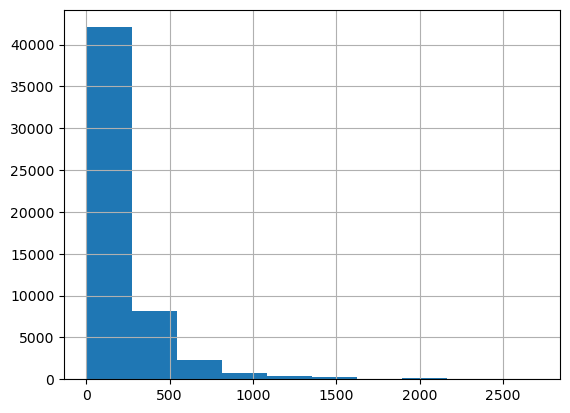

In [21]:
segment_day_trips['trip_id'].hist()

In [22]:
def get_line_string(row):
    start = Point(row.start_lng, row.start_lat)
    end = Point(row.end_lng, row.end_lat)
    line = LineString([start, end])
    row["geometry"] = line
    return row



In [23]:
vmin = segment_day_trips["trip_id"].min()
vmax = segment_day_trips["trip_id"].quantile(.95)
vcenter = segment_day_trips["trip_id"].mean()
norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

In [24]:
segment_day_trips_gpd = gpd.GeoDataFrame(segment_day_trips.apply(get_line_string, axis=1)).set_crs(epsg=4326)

<Axes: >

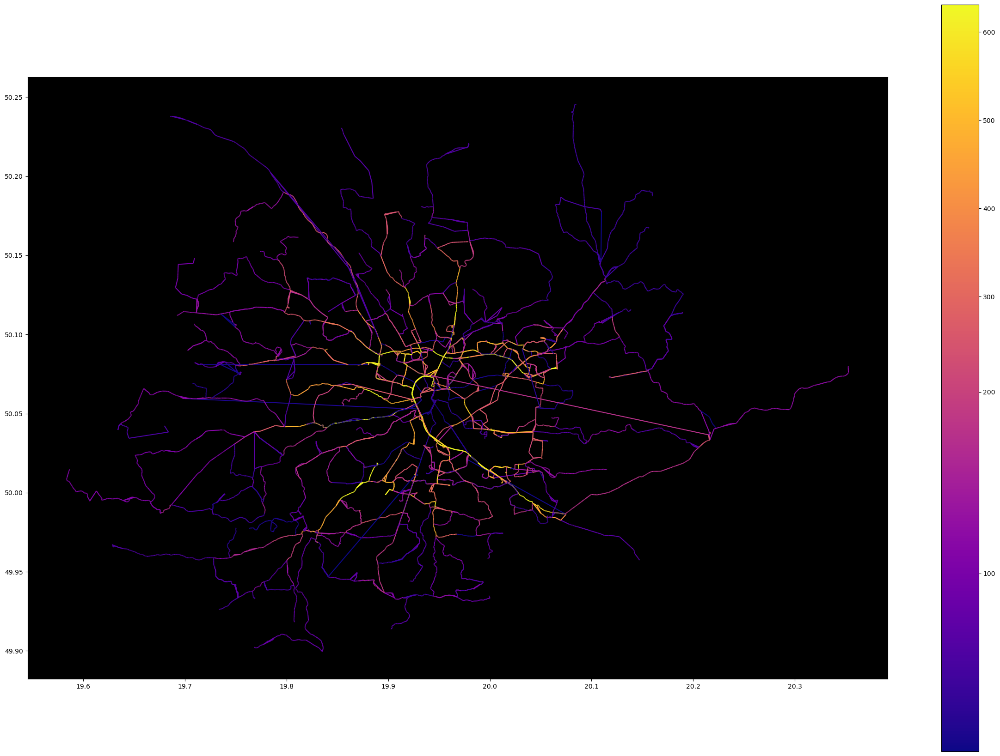

In [25]:
fig = plt.figure(figsize=(30,21))
ax = plt.axes()
ax.set(facecolor = "black")
segment_day_trips_gpd.plot(ax=ax, cmap="plasma", column='trip_id', legend=True, norm=norm)

## Second step
Convert stops and routes into a directed graph where:

Nodes = Transit stops (with coordinates from stops_df)
Edges = Segments between consecutive stops (enriched with trip counts and schedules).

In [35]:
import networkx as nx
import plotly.express as px

# Create directed graph
G = nx.DiGraph()

# Add stops as nodes with coordinates
for _, stop in stops_df.iterrows():
    G.add_node(stop['stop_id'], 
               pos=(stop['stop_lon'], stop['stop_lat']),
               name=stop['stop_name'])

# Create edges between consecutive stops in trips
stop_times_sorted = stop_times_df.sort_values(['trip_id', 'stop_sequence'])

edges = []
current_trip = None
prev_stop_id = None

for _, row in stop_times_sorted.iterrows():
    if current_trip != row['trip_id']:
        # Reset for new trip
        current_trip = row['trip_id']
        prev_stop_id = row['stop_id']
    else:
        # Add edge between previous and current stop
        edges.append((prev_stop_id, row['stop_id']))
        prev_stop_id = row['stop_id']

# Add edges to graph with trip counts
edge_counts = pd.Series(edges).value_counts().reset_index()
edge_counts.columns = ['edge', 'trip_count']

for _, edge_row in edge_counts.iterrows():
    u, v = edge_row['edge']
    G.add_edge(u, v, trips=edge_row['trip_count'])

### 2. Time-Aware Traffic Visualization

Visualize how trip frequency changes throughout the day using aggregated hourly data.



In [32]:
import pandas as pd

# Convert arrival/departure times to seconds since midnight
def convert_gtfs_time(time_str):
    hours, minutes, seconds = map(int, time_str.split(':'))
    return pd.Timedelta(hours=hours, minutes=minutes, seconds=seconds)

# Convert all times to proper datetime format
stop_times_df['arrival_td'] = stop_times_df['arrival_time'].apply(convert_gtfs_time)
stop_times_df['departure_td'] = stop_times_df['departure_time'].apply(convert_gtfs_time)

# Create normalized datetime (using arbitrary date as base)
base_date = pd.Timestamp('2023-01-01')
stop_times_df['arrival_dt'] = base_date + stop_times_df['arrival_td']
stop_times_df['departure_dt'] = base_date + stop_times_df['departure_td']

# Extract normalized hours
stop_times_df['hour'] = stop_times_df['arrival_dt'].dt.hour

In [33]:
# Create edges between consecutive stops
stop_times_sorted = stop_times_df.sort_values(['trip_id', 'stop_sequence'])
stop_times_sorted['next_stop'] = stop_times_sorted.groupby('trip_id')['stop_id'].shift(-1)

# Filter valid edges and count trips per hour
hourly_edges = stop_times_sorted.dropna(subset=['next_stop']).copy()
hourly_edges = hourly_edges[['trip_id', 'stop_id', 'next_stop', 'hour']]

In [38]:
# Aggregate trips per edge-hour combination
hourly_counts = (hourly_edges.groupby(['stop_id', 'next_stop', 'hour'])
                .size()
                .reset_index(name='trips'))

# Merge with coordinates for both start and end stops
hourly_counts = hourly_counts.merge(
    stops_df[['stop_id', 'stop_lat', 'stop_lon']],
    left_on='stop_id',
    right_on='stop_id',
    suffixes=('', '_start')
).merge(
    stops_df[['stop_id', 'stop_lat', 'stop_lon']],
    left_on='next_stop',
    right_on='stop_id',
    suffixes=('_start', '_end')
)
hourly_counts_lines = hourly_counts.copy()
hourly_counts_lines = hourly_counts_lines.explode(
    column=['stop_lat_start', 'stop_lat_end', 'stop_lon_start', 'stop_lon_end']
)

# Create animated line visualization
fig = px.line_mapbox(
    hourly_counts_lines,
    lat='stop_lat_start',
    lon='stop_lon_start',
    animation_frame='hour',
    color='trips',
    zoom=11,
    height=800
)

fig.update_layout(
    mapbox_style="carto-darkmatter",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    showlegend=False
)
fig.show()

/var/folders/67/nn0_dngd0cngz2f05n5j1xpm0000gn/T/ipykernel_32768/3959009672.py:24: DeprecationWarning:

*line_mapbox* is deprecated! Use *line_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [39]:
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

# Create DynamicMap
def update_plot(hour):
    hour_data = hourly_counts[hourly_counts.hour == hour]
    return hv.Paths(
        [{'lat': [row.stop_lat_start, row.stop_lat_end],
          'lon': [row.stop_lon_start, row.stop_lon_end]} 
         for _, row in hour_data.iterrows()],
        vdims='trips'
    ).opts(
        color='trips', cmap='plasma',
        line_width=hv.dim('trips')*0.1,
        width=800, height=600
    )

hv.DynamicMap(update_plot, kdims=['hour']).redim.range(hour=(0,23))

ModuleNotFoundError: No module named 'holoviews'

In [43]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
# 1. Process Shapes Data
shapes = pd.read_csv('gtfs/shapes.txt')
shapes = shapes.sort_values(['shape_id', 'shape_pt_sequence'])

# 2. Merge with Trip Information
trips = pd.read_csv('gtfs/trips.txt')
routes = pd.read_csv('gtfs/routes.txt')[['route_id', 'route_short_name']]
shape_trips = trips[['shape_id', 'route_id', 'direction_id']].drop_duplicates()

# Merge shapes with trip information to include route_id
shapes = shapes.merge(shape_trips, on='shape_id', how='left')

# 3. Create Route Paths
def create_route_lines(df):
    return LineString(zip(df['shape_pt_lon'], df['shape_pt_lat']))

route_paths = shapes.groupby(['shape_id', 'route_id', 'direction_id']).apply(create_route_lines).reset_index()
route_paths.columns = ['shape_id', 'route_id', 'direction_id', 'geometry']

# 4. Calculate Trip Frequency
trip_counts = trips.groupby(['shape_id', 'direction_id']).size().reset_index(name='trip_count')
route_paths = route_paths.merge(trip_counts, on=['shape_id', 'direction_id'])

# Merge with route_short_name
route_paths = route_paths.merge(routes, on='route_id', how='left')  # Ensure route_short_name is included

# 5. Create Interactive Visualization
fig = px.line_mapbox(
    route_paths,
    lat=route_paths.geometry.apply(lambda x: x.coords[0][1]),
    lon=route_paths.geometry.apply(lambda x: x.coords[0][0]),
    color='route_short_name',  # Now this column exists
    line_group='shape_id',
    hover_name='route_short_name',
    hover_data=['direction_id', 'trip_count'],
    zoom=11,
    height=800
)

# 6. Add Actual Path Geometry
for idx, row in route_paths.iterrows():
    fig.add_trace(go.Scattermapbox(
        lon=[x[0] for x in row.geometry.coords],
        lat=[x[1] for x in row.geometry.coords],
        mode='lines',
        line=dict(width=2 + row.trip_count / 10, color=px.colors.qualitative.Plotly[idx % 10]),
        hoverinfo='text',
        hovertext=f"{row.route_short_name} | Direction {row.direction_id}<br>{row.trip_count} trips",
        showlegend=False
    ))

# 7. Add Stops Markers
stops = pd.read_csv('gtfs/stops.txt')
fig.add_trace(go.Scattermapbox(
    lat=stops['stop_lat'],
    lon=stops['stop_lon'],
    mode='markers',
    marker=dict(size=4, color='lightgray'),
    hoverinfo='text',
    hovertext=stops['stop_name'],
    name='Bus Stops'
))

# 8. Final Layout Configuration
fig.update_layout(
    mapbox_style="carto-darkmatter",
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    legend=dict(
        title='Bus Routes',
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    )
)

fig.show()

/var/folders/67/nn0_dngd0cngz2f05n5j1xpm0000gn/T/ipykernel_32768/631944173.py:20: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/var/folders/67/nn0_dngd0cngz2f05n5j1xpm0000gn/T/ipykernel_32768/631944173.py:31: DeprecationWarning:

*line_mapbox* is deprecated! Use *line_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

/var/folders/67/nn0_dngd0cngz2f05n5j1xpm0000gn/T/ipykernel_32768/631944173.py:45: DeprecationWarning:

*scattermapbox* is deprecated! Use *scattermap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

/var/folders/67/nn0_dngd0cngz2f05n5j1xpm0000gn/T/ipykernel_32768/631944173.py:57: DeprecationWarning:

*scattermapbox* is deprecated! Use

3. Interactive Network Modification

Simulate road closures/reroutes using a dashboard where users can toggle edges on/off.



In [ ]:
from dash import Dash, html, callback, Output, Input
import dash_leaflet as dl

app = Dash(__name__)

# Initial map
app.layout = html.Div([
    dl.Map(children=[
        dl.TileLayer(),
        dl.LayerGroup(id="edges-layer")
    ], style={'width': '100%', 'height': '80vh'}),
    html.Button('Toggle Edge', id='toggle-btn')
])

@callback(
    Output('edges-layer', 'children'),
    Input('toggle-btn', 'n_clicks')
)
def update_map(n_clicks):
    # Logic to toggle edges (pseudo-code)
    modified_edges = compute_modified_edges(n_clicks)
    return [
        dl.Polyline(positions=[(u_pos, v_pos)], 
        color='red' if edge_disabled else 'blue'
        ) for (u, v) in modified_edges
    ]

def compute_modified_edges(n_clicks):
    # Example: Toggle a specific edge on every click
    edge_to_toggle = ('stop_A', 'stop_B')
    if n_clicks % 2 == 1:
        G.remove_edge(*edge_to_toggle)
    else:
        G.add_edge(*edge_to_toggle)
    return G.edges()

4. Traffic Prediction Model

Train a model to predict segment usage based on time/day.



In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Prepare time series data (hourly trip counts)
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(hourly_counts[['trips']])

# Split into train/test sequences
X, y = [], []
for i in range(24, len(scaled_data)):
    X.append(scaled_data[i-24:i])
    y.append(scaled_data[i])
X, y = np.array(X), np.array(y)

# Build model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X.shape[1], 1)))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.fit(X, y, epochs=10)